# Imports

In [1]:
import numpy as np
import os
import cv2
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import pandas as pd

# save predit img_pr
import glob

# split data
from sklearn.model_selection import train_test_split


2024-07-19 18:50:37.417908: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-19 18:50:38.199633: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /media/sda2/home/j/.0installed/test_env/lib/python3.10/site-packages/cv2/../../lib64:
2024-07-19 18:50:38.199764: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-07-19 18:50:38.316004: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS w

# Plot imgs

In [2]:
# https://github.com/karolzak/keras-unet/blob/9b7aff5247fff75dc4e2a11ba9c45929b9166d1f/keras_unet/utils.py

MASK_COLORS = ["red", "green", "blue", "yellow", "magenta", "cyan"]

def mask_to_rgba(mask, color="red"):
    """
    Converts binary segmentation mask from white to red color.
    Also adds alpha channel to make black background transparent.

    Args:
        mask (numpy.ndarray): [description]
        color (str, optional): Check `MASK_COLORS` for available colors. Defaults to "red".

    Returns:
        numpy.ndarray: [description]
    """
    assert(color in MASK_COLORS)
    assert(mask.ndim==3 or mask.ndim==2)

    h = mask.shape[0]
    w = mask.shape[1]
    zeros = np.zeros((h, w))
    ones = mask.reshape(h, w)
    if color == "red":
        return np.stack((ones, zeros, zeros, ones), axis=-1)
    elif color == "green":
        return np.stack((zeros, ones, zeros, ones), axis=-1)
    elif color == "blue":
        return np.stack((zeros, zeros, ones, ones), axis=-1)
    elif color == "yellow":
        return np.stack((ones, ones, zeros, ones), axis=-1)
    elif color == "magenta":
        return np.stack((ones, zeros, ones, ones), axis=-1)
    elif color == "cyan":
        return np.stack((zeros, ones, ones, ones), axis=-1)

def get_cmap(arr):
    """[summary]

    Args:
        arr (numpy.ndarray): [description]

    Returns:
        string: [description]
    """
    if arr.ndim == 3:
        return "gray"
    elif arr.ndim == 4:
        if arr.shape[3] == 3:
            return "jet"
        elif arr.shape[3] == 1:
            return "gray"

def zero_pad_mask(mask, desired_size):
    """[summary]

    Args:
        mask (numpy.ndarray): [description]
        desired_size ([type]): [description]

    Returns:
        numpy.ndarray: [description]
    """
    pad = (desired_size - mask.shape[0]) // 2
    padded_mask = np.pad(mask, pad, mode="constant")

    return padded_mask

def reshape_arr(arr):
    """[summary]

    Args:
        arr (numpy.ndarray): [description]

    Returns:
        numpy.ndarray: [description]
    """
    if arr.ndim == 3:
        return arr
    elif arr.ndim == 4:
        if arr.shape[3] == 3:
            return arr
        elif arr.shape[3] == 1:
            return arr.reshape(arr.shape[0], arr.shape[1], arr.shape[2])


## plot_imgs_jb

In [3]:
def plot_imgs_jb(org_imgs, mask_imgs, pred_imgs = None, nm_img_to_plot = 10, figsize = 4, alpha = 0.5,
                 color = "red", overlay = "", count_star = 0, show_plot = True, save_plot = False,
                 path_save = "", lang_val = "pt", new_test = "", structuring_element = "", pr_morphs = None):
    """
    Image plotting for semantic segmentation data.
    Last column is always an overlay of ground truth or prediction
    depending on what was provided as arguments.
    Args:
        org_imgs (numpy.ndarray): Array of arrays representing a collection of original images.
        mask_imgs (numpy.ndarray): Array of arrays representing a collection of mask images (grayscale).
        pred_imgs (numpy.ndarray, optional): Array of arrays representing a collection of prediction masks
                                             images.. Defaults to None.
        nm_img_to_plot (int, optional): How many images to display. Takes first N images. Defaults to 10.
        figsize (int, optional): Matplotlib figsize. Defaults to 4.
        alpha (float, optional): Transparency for mask overlay on original image. Defaults to 0.5.
        color (str, optional): Color for mask overlay. Defaults to "red".
        lang_val (str, optional): language of info in plots "pt" or "en". Defaults is "pt"
        other_test (srt, optional): the name of third colum of images in plots. A new/other "test"
        structuring_element (srt, optional): the structuring element in third colum of images in plots.
                                             A new/other "test"
    """ # NOQA E501
    assert(color in MASK_COLORS)

    #from matplotlib import rcParams
    #rcParams.update({'figure.autolayout': True})

    #lang_val = "pt" # pt or en
    if lang_val == "pt":
        field_1 = "Imagem original"
        field_2 = "Marcação feita \n pelo especialista"
        field_3 = "Predição"

        if new_test == "": # 4 cols
            field_4 = "Sobreposição\n"
            ind_3 = 3
        else: # 5 cols
            field_4 = new_test
            field_5 = "Sobreposição\n"
            ind_3 = 4

        label_TP= "VP"
        label_TN= "VN"
    else:
        field_1 = "Original"
        field_2 = "Ground truth"

        if new_test == "":
            field_3 = "Prediction"
        else:
            field_3 = new_test

        field_4 = "Overlay"
        label_TP= "TP"
        label_TN= "TN"

    if nm_img_to_plot > org_imgs.shape[0]:
        nm_img_to_plot = org_imgs.shape[0]

    im_id = 0
    org_imgs_size = org_imgs.shape[1]

    org_imgs = reshape_arr(org_imgs)
    mask_imgs = reshape_arr(mask_imgs)
    if not (pred_imgs is None):
        cols = 4
        pred_imgs = reshape_arr(pred_imgs)

        if new_test != "":
            cols = 5
    else:
        cols = 3

    fig, axes = plt.subplots(nm_img_to_plot, cols, figsize = (cols * figsize, nm_img_to_plot * figsize),
                             squeeze = False, constrained_layout = True)

    #if new_test == "":
        #fig.tight_layout()
    #if new_test != '':
        #fig.tight_layout(h_pad = 5, w_pad = 5)
        #fig.tight_layout(h_pad = 0.5, w_pad = 0.2)
        #plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)

    font_size = 30
    print(f"{count_star = }")

    if overlay == "org_imgs":
        print("\n# overlay ori_imgs vs mask\n")
        pad_value = 0
    else:
        print("\n# overlay mask vs predict\n")
        #pad_value = 60
        pad_value = 50

    print("count:", end = " ")

    #axes[0, 0].set_title("Original", fontsize = font_size, pad = pad_value)
    axes[0, 0].set_title(field_1, fontsize = font_size, pad = pad_value)

    #axes[0, 1].set_title("Ground truth", fontsize = font_size, pad = pad_value)
    axes[0, 1].set_title(field_2, fontsize = font_size, pad = pad_value)
    if not (pred_imgs is None):
        #axes[0, 2].set_title("Prediction", fontsize = font_size, pad = pad_value)
        axes[0, 2].set_title(field_3, fontsize = font_size, pad = pad_value)

        #axes[0, 3].set_title("Overlay", fontsize = font_size, pad = pad_value)
        axes[0, 3].set_title(field_4, fontsize = font_size, pad = pad_value)

        if new_test != "":
            axes[0, 4].set_title(field_5, fontsize = font_size, pad = pad_value)

    else:
        #axes[0, 2].set_title("Overlay", fontsize = font_size, pad = pad_value)
        axes[0, 2].set_title(field_4, fontsize = font_size, pad = pad_value)

    for m in range(0, nm_img_to_plot):
        print(m + 1, end = " ")

        img_org = org_imgs[im_id]
        img_org = img_org[...,::-1] # BGR to RGB

#         axes[m, 0].imshow(org_imgs[im_id], cmap=get_cmap(org_imgs))
        axes[m, 0].imshow(img_org, cmap=get_cmap(org_imgs))

        axes[m, 0].set_axis_off()

        mask_img = mask_imgs[im_id].copy()

        mask_img[mask_img >= 0.5] = 1
        mask_img[mask_img < 1] = 0
        mask_img = mask_img.astype('uint8')
        #print("Max mask_img:", np.max(mask_img))

#         axes[m, 1].imshow(mask_imgs[im_id], cmap=get_cmap(mask_imgs))
        axes[m, 1].imshow(mask_img, cmap=get_cmap(mask_imgs))

        axes[m, 1].set_axis_off()
        if not (pred_imgs is None):
            pr_img = pred_imgs[im_id].copy()

            pr_img[pr_img >= 0.5] = 1
            pr_img[pr_img < 1] = 0
            pr_img = pr_img.astype('uint8')
            #print("Max pr_img:", np.max(pr_img))

            #axes[m, 2].imshow(pred_imgs[im_id], cmap=get_cmap(pred_imgs))
            axes[m, 2].imshow(pr_img, cmap=get_cmap(pred_imgs))

            # Calc and print dice
            calc_dice_one(list_img[m], mask_img, pr_img)

            if new_test != "":
                #text_op_morph = ''
                if m == 0: text_op_morph = "Dilatação"
                elif m == 1: text_op_morph = "Erosão"
                elif m == 2: text_op_morph = "Abertura"
                elif m == 3: text_op_morph = "Fechamento"

                #structuring_element = " + Todos_1"
                #structuring_element = " + Cruz"

                #text_op_morph = text_op_morph + " + " + structuring_element
                text_op_morph = text_op_morph
                print("structuring_element: ", structuring_element)

                    #MORPH_CLOSE_allOne
                    #MORPH_CLOSE_cross
                    #MORPH_DILATE_allOne
                    #MORPH_DILATE_cross
                    #MORPH_ERODE_allOne
                    #MORPH_ERODE_cross
                    #MORPH_OPEN_allOne
                    #MORPH_OPEN_cross

                #axes[m, 3].text(50, -10, text_op_morph, fontsize=30)
                axes[m, 3].text(100, -10, text_op_morph, fontsize=30)

            axes[m, 2].set_axis_off()

#             print("get_cmap(org_imgs):", get_cmap(org_imgs))
#             print("get_cmap(mask_imgs):", get_cmap(mask_imgs))
#             print("get_cmap(pred_imgs):", get_cmap(pred_imgs))

            if overlay == "org_imgs":
                axes[m, 3].imshow(org_imgs[im_id], cmap=get_cmap(org_imgs))

                axes[m, 3].imshow(mask_to_rgba(
#                                 zero_pad_mask(pred_imgs[im_id], desired_size=org_imgs_size),
                                zero_pad_mask(mask_imgs[im_id], desired_size=org_imgs_size),
                                color=color), cmap=get_cmap(pred_imgs), alpha=alpha)

            else: # overlay == "mask_imgs":
#                 axes[m, 3].imshow(mask_imgs[im_id], cmap=get_cmap(mask_imgs))
#                 axes[m, 3].imshow(pred_imgs[im_id], cmap=get_cmap(mask_imgs))

                if not (pr_morphs is None):
                    pr_img = pr_morphs[im_id].copy()

                    pr_img[pr_img >= 0.5] = 1
                    pr_img[pr_img < 1] = 0
                    pr_img = pr_img.astype('uint8')
                    #print("Max pr_img:", np.max(pr_img))

                    #axes[m, 2].imshow(pred_imgs[im_id], cmap=get_cmap(pred_imgs))
                    axes[m, 3].imshow(pr_img, cmap=get_cmap(pred_imgs))

                    axes[m, 3].set_axis_off()

                dim0 = pr_img.shape[0]
                dim1 = pr_img.shape[1]
                zeros = np.zeros((dim0, dim1))
                img_result = np.stack((zeros, zeros, zeros), axis=-1)

                img_result = img_result.astype('uint8')
#                 print("pr_img.shape:", pr_img.shape)
#                 print("mask_img.shape:", mask_img.shape)

#                 print("img_result.shape:", img_result.shape)
#                 print("img_result.dtype:", img_result.dtype)

                i = 0
                while i < dim0:
                    #print("i", i)
                    j = 0
                    while j < dim1:
                        #print("j", j)
                        if mask_img[i][j] == pr_img[i][j]:
                            if pr_img[i][j] == 1: # True Positive
                                img_result[i][j] = (255, 255, 255) # white
                            else: # True Negative
                                img_result[i][j] = (0, 0, 0) # black
                        else:
                            if pr_img[i][j] == 1: # False Positive
                                img_result[i][j] = (255, 0, 0) # red
                            else: # False Negative
                                img_result[i][j] = (0, 0, 255) # blue FN

                        j += 1

                    i += 1

#                 print("img_result:", img_result)
#                 cv2.imwrite("img_result.png", img_result)

                axes[m, ind_3].imshow(img_result)

                if im_id == 0:
                    import matplotlib.patches as mpatches
#                     import matplotlib.pyplot as plt

                    white_patch = mpatches.Patch(color = "white", label = label_TP)
                    black_patch = mpatches.Patch(color = "black", label = label_TN)
                    red_patch = mpatches.Patch(color = "red", label = "FP")
                    blue_patch = mpatches.Patch(color = "blue", label = "FN")

                    axes[m, ind_3].legend(handles=[white_patch, black_patch, red_patch, blue_patch],
                                bbox_to_anchor=(0, 1, 1, 0.2), loc = "lower center", ncol = 4,
                                fontsize = font_size - 10, facecolor = '#EEEEEE', framealpha = 1)

            axes[m, ind_3].set_axis_off()

        else:
            img_org_2 = org_imgs[im_id]
            img_org_2 = img_org_2[...,::-1] # BGR to RGB

            #axes[m, 2].imshow(org_imgs[im_id], cmap=get_cmap(org_imgs))
            axes[m, 2].imshow(img_org_2, cmap=get_cmap(org_imgs))

            mask_img_2 = mask_imgs[im_id].copy()

            mask_img_2[mask_img_2 >= 0.5] = 1
            mask_img_2[mask_img_2 < 1] = 0
            mask_img_2 = mask_img_2.astype('uint8')

            axes[m, 2].imshow(
                mask_to_rgba(
                    #zero_pad_mask(mask_imgs[im_id], desired_size=org_imgs_size),
                    zero_pad_mask(mask_img_2, desired_size=org_imgs_size),
                    color=color,
                ),
                cmap=get_cmap(mask_imgs),
                alpha=alpha,
            )
            axes[m, 2].set_axis_off()
        im_id += 1

    if show_plot:
        plt.show()
    else:
        plt.clf()
        plt.close()

    if save_plot:
        if path_save == '':
            path_save = os.getcwd()

        file_name = "p_" + str(count_star) + "_" + overlay + "_SE_" + structuring_element + ".pdf"

        print("Saving img in:", path_save)
        print("file name:", file_name)

        fig_dpi = 50 # default is 100

        #fig.savefig(path_save + "plot_imgs_jb_" + str(count_star) + ".png", dpi = fig.dpi) # Save plots
        #fig.savefig(path_save + "p_" + str(count_star) + "_" + overlay + ".pdf", dpi = fig_dpi)
        fig.savefig(path_save + '/' + file_name, dpi = fig_dpi, bbox_inches="tight")


## load_selected_imgs

In [4]:
def load_selected_imgs(path, list_img, mode):
    print(f"\npath: {path} len(list_img): {len(list_img)}")

    imgs = []
    for file in list_img:
        img_path = os.path.join(path, file)
        #print(f"img_path: {img_path}")
        img = cv2.imread(img_path, mode)

        #print("Max:", np.max(img))
        if mode == 0:
            img = np.expand_dims(img, 2)

        img = img / float(255)
        imgs.append(img)

    return np.array(imgs)


## load dataset A to E

In [5]:
#path = "/media/sda2/home/j/Downloads/0del/00/iv_dl_tests/Recortes/"
#path = "E:/Backes/Segmentacao Linha Plantio CNN/Recortes/"
##path = "/run/media/j/Files_ex/0_f_mest_bkp/datasets/Recortes/"
path = "/run/media/j/tmp_ntfs/0_t_mest_bkp/datasets/Recortes/"

test_use = 1 # 1 or 9

path_predict = "/media/sda2/home/j/Downloads/0del/00/iv_dl_tests/Teste_0" + str(test_use) + "E/result-images/"
#path_predict = "E:/Backes/Segmentacao Linha Plantio CNN/Recortes/Base_A/Teste_01E/result-images/"
##path_predict = "/run/media/j/Files_ex/0_f_mest_bkp_outros/iv_results/results_E_1/"
path_predict = "/run/media/j/tmp_ntfs/0_t_mest_bkp_outros/iv_results/results_E_1/"
path_predict = path_predict + "test_" + str(test_use) + "_U-Net_without_VI_weights_Base_E/result_images/predict_Base_E/"

base_train = "E"

# cro 1, 3, 30, 133, 245, 378, 430, 503, 504,
# b 2 13 242 428 488 819 916

##list_img = ("A_0001.png", "A_0030.png", "A_0041.png", "A_0133.png",
##            "A_0503.png", "B_0916.png", "C_0274.png", "D_1819.png") # Used in the paper with test 9
#list_img = ("A_0001.png", "A_0030.png", "A_0041.png", "A_0133.png", "A_0503.png")

#list_img = ("B_0013.png", "B_0242.png", "B_0428.png", "B_0488.png", "B_0819.png", "B_0916.png")

#list_img = ("A_0103.png", "B_0002.png", "C_0002.png", "D_0003.png")

list_img = ("C_0083.png", "C_0242.png", "C_0163.png", "C_0274.png", "C_0288.png", "C_1007.png")

#list_img = ("C_0083.png", "C_0163.png", "C_0274.png", "C_0288.png", "C_1007.png")

imgs = load_selected_imgs(path + 'Base_' + base_train + '/', list_img, 1)
masks = load_selected_imgs(path + 'Base_' + base_train + '_mask/', list_img, 0)
pr_imgs = load_selected_imgs(path_predict, list_img, 0)

print("\nImages loaded!")



path: /run/media/j/tmp_ntfs/0_t_mest_bkp/datasets/Recortes/Base_E/ len(list_img): 6

path: /run/media/j/tmp_ntfs/0_t_mest_bkp/datasets/Recortes/Base_E_mask/ len(list_img): 6

path: /run/media/j/tmp_ntfs/0_t_mest_bkp_outros/iv_results/results_E_1/test_1_U-Net_without_VI_weights_Base_E/result_images/predict_Base_E/ len(list_img): 6

Images loaded!


## Load dataset Lapix

In [ ]:
# Lapix

path = "/run/media/j/Files_ex/0_f_mest_bkp/datasets/Recortes/"

start = "/run/media/j/Files_ex/0_f_mest_bkp_outros/new_04_01_2023/results_L/"

#folder_user = "test_9_U-Net_without_VI_weights_Base_E/" # Weight Base E
folder_user = "test_9_U-Net_without_VI_weights_Base_L/" # Weight Base L

path_predict = start + folder_user + "result_images/predict_Base_L/"

list_img = ("sugarcane1_0115.png" , "sugarcane1_0202.png", "sugarcane1_0322.png")

# To create a tuple with only one item, have add a comma after the item,
# otherwise Python will recognize the variable as str
list_img = ("sugarcane1_0793.png",)

list_img = ("sugarcane1_0793.png", "sugarcane1_0115.png" , "sugarcane1_0202.png", "sugarcane1_0322.png")

base_train = "L"

imgs = load_selected_imgs(path + 'Base_' + base_train + '/', list_img, 1)
masks = load_selected_imgs(path + 'Base_' + base_train + '_mask/', list_img, 0)
pr_imgs = load_selected_imgs(path_predict, list_img, 0)

print("\nImages loaded!")


## Plot selected images

### Dice

In [6]:
def dice(y_pred, y_true, k = 1):
    intersection = np.sum(y_pred[y_true==k]) * 2.0
    dice = intersection / (np.sum(y_pred) + np.sum(y_true))
    return dice


In [7]:
def img_pr_mask_adjust_load_selected_imgs(img):
    #img = img / 255.0 # In load_selected_imgs do this part
    img = np.array(img)

    #print(img.shape)
    #img = img[:,:, 0] # imread IMREAD_GRAYSCALE
    #print(img.shape)

    img[img >= 0.5] = 1
    img[img < 1] = 0
    img = img.astype('uint8')

    return img


In [8]:
def calc_dice(list_img, mask_imgs, pred_imgs):
    for i, name in enumerate(list_img):
        print(f"{i+1} name: {name}", end = " ")

        img_pr = mask_imgs[i].copy()
        img_mask = pred_imgs[i].copy()

        img_pr = img_pr_mask_adjust_load_selected_imgs(img_pr)
        img_mask = img_pr_mask_adjust_load_selected_imgs(img_mask)

        dice_score = dice(img_pr, img_mask, k = 1) # k can be 255 or 1
        print(dice_score)


In [9]:
calc_dice(list_img, masks, pr_imgs)


1 name: C_0083.png 0.9298963749677324
2 name: C_0242.png 0.9410819594310857
3 name: C_0163.png 0.9286924529215278
4 name: C_0274.png 0.9530014870470377
5 name: C_0288.png 0.8637117617559696
6 name: C_1007.png 0.9195385793605207


In [10]:
def calc_dice_one(name, img_pr, img_mask):
    print(f"{name}", end = " ")

    img_pr = img_pr_mask_adjust_load_selected_imgs(img_pr)
    img_mask = img_pr_mask_adjust_load_selected_imgs(img_mask)

    dice_score = dice(img_pr, img_mask, k = 1) # k can be 255 or 1
    print(dice_score)


### Plot

count_star = 0

# overlay ori_imgs vs mask

count: 1 2 3 4 5 6 

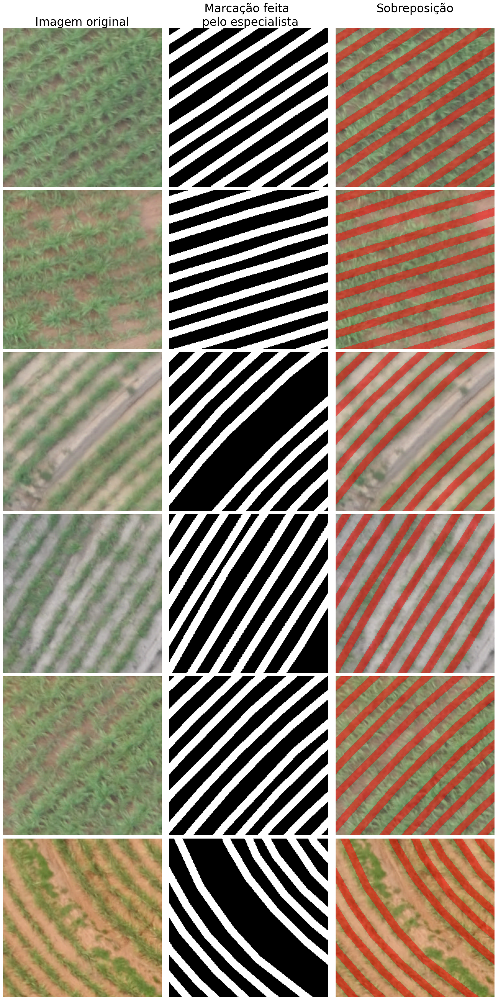

count_star = 0

# overlay mask vs predict

count: 1 C_0083.png 0.9298963749677324
2 C_0242.png 0.9410819594310857
3 C_0163.png 0.9286924529215278
4 C_0274.png 0.9530014870470377
5 C_0288.png 0.8637117617559696
6 C_1007.png 0.9195385793605207


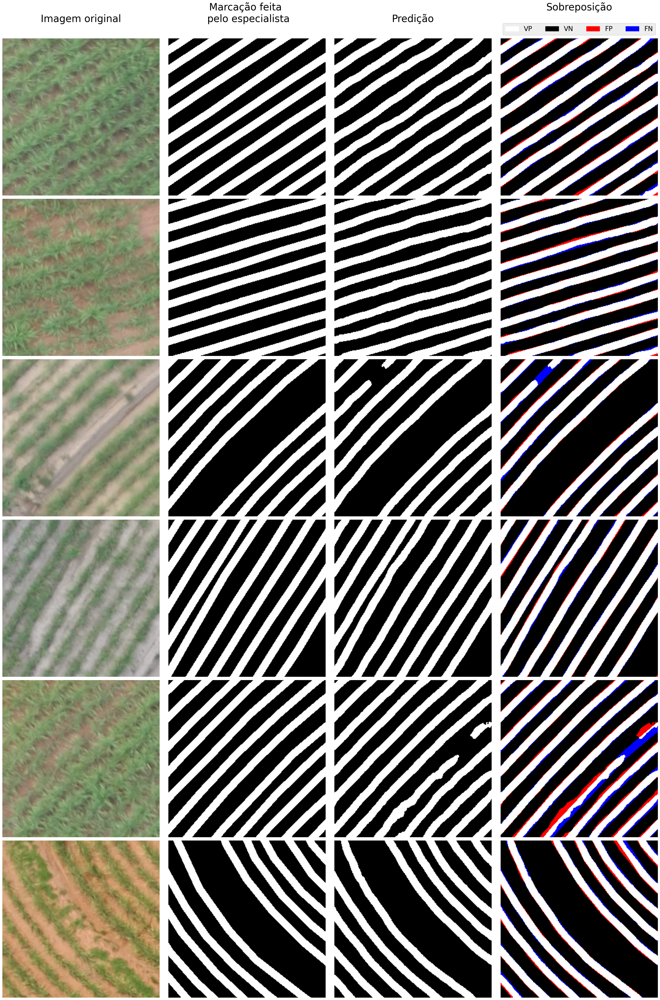

In [11]:
plots = len(imgs) # 5 imagens to good paper size
#plots = 4 # 5 imagens to good paper size

lang = "pt" # pt or en
#lang = "en"

save_plot_l = True # save plot local variable
save_plot_l = False

## overlay ori_imgs vs mask - pred_imgs is None
plot_imgs_jb(org_imgs = imgs, mask_imgs = masks, nm_img_to_plot = plots,
                figsize = 6, overlay = "org_imgs", save_plot = save_plot_l,
                path_save = "", lang_val = lang)

## overlay mask vs predict
#plot_imgs_jb(org_imgs = imgs, mask_imgs = masks, nm_img_to_plot = plots, pred_imgs = pr_imgs, figsize = 8,
#            overlay = "mask", save_plot = save_plot_l,
#            path_save = "",lang_val = lang)

plot_imgs_jb(org_imgs = imgs, mask_imgs = masks, nm_img_to_plot = plots, pred_imgs = pr_imgs, figsize = 7,
            overlay = "mask", count_star = 0, show_plot = True, save_plot = save_plot_l,
            path_save = "", lang_val = lang)


## morphological operations

In [ ]:
def load_selected_imgs_morph(path, img_name, mode):
    #print(f"\npath: {path} len(list_img): {len(list_img)}")

    imgs = []
    #for file in list_img:
        #img_path = os.path.join(path, file)
    img_path = os.path.join(path, img_name)

    print(f"img_path: {img_path}")
    img = cv2.imread(img_path, mode)

    #print("Max:", np.max(img))
    if mode == 0:
        img = np.expand_dims(img, 2)

    img = img / float(255)
    #imgs.append(img)

    #return np.array(imgs)
    return img

#path = "/media/sda2/home/j/Downloads/0del/00/iv_dl_tests/Recortes/"
#path = "E:/Backes/Segmentacao Linha Plantio CNN/Recortes/"
path = "/run/media/j/Files_ex/0_f_mest_bkp/datasets/Recortes/"

#test_use = 9 # 1 or 9
#test_use = 1 # 1 or 9

#path_predict = "/media/sda2/home/j/Downloads/0del/00/iv_dl_tests/Teste_0" + str(test_use) + "E/result-images/"
#path_predict = "E:/Backes/Segmentacao Linha Plantio CNN/Recortes/Base_A/Teste_01E/result-images/"

#MORPH_CLOSE_allOne
#MORPH_CLOSE_cross
#MORPH_DILATE_allOne
#MORPH_DILATE_cross
#MORPH_ERODE_allOne
#MORPH_ERODE_cross
#MORPH_OPEN_allOne
#MORPH_OPEN_cross

base_train = "E"
#base_train = "L"

if base_train == "E":
    path_predict = "/run/media/j/Files_ex/0_f_mest_bkp_outros/iv_results/results_E_1/"
    path_predict = path_predict  + "test_1_U-Net_without_VI_weights_Base_E/result_images/predict_Base_E/"

    # cro 1, 3, 30, 133, 245, 378, 430, 503, 504,
    # b 2 13 242 428 488 819 916

    #list_img = ("A_0001.png", "A_0030.png", "A_0041.png", "A_0133.png",
    #            "A_0503.png", "B_0916.png", "C_0274.png", "D_1819.png") # Used in the paper with test 9
    #list_img = ("A_0001.png", "A_0030.png", "A_0041.png", "A_0133.png", "A_0503.png")

    #list_img = ("B_0013.png", "B_0242.png", "B_0428.png", "B_0488.png", "B_0819.png", "B_0916.png")

    #list_img = ("C_0083.png", "C_0242.png", "C_0163.png", "C_0274.png", "C_0288.png", "C_1007.png")
    #list_img = ("C_0083.png", "C_0163.png", "C_0274.png", "C_0288.png", "C_1007.png")

    #list_img = ("C_1298.png", "C_1266.png", "C_1206.png", "C_1481.png")

    list_img = ("A_0063.png", "A_0078.png", "A_0114.png", "B_0650.png")

elif base_train == "L":
    path_predict = "/run/media/j/Files_ex/0_f_mest_bkp_outros/new_04_01_2023/results_L/"
    path_predict = path_predict  + "test_9_U-Net_without_VI_weights_Base_L/result_images/predict_Base_L/"

    #list_img = ("sugarcane1_0793.png", "sugarcane1_0115.png" , "sugarcane1_0202.png", "sugarcane1_0322.png")
    list_img = ("sugarcane1_0241.png", "sugarcane1_0162.png" , "sugarcane1_0163.png", "sugarcane1_0282.png")

imgs = load_selected_imgs(path + 'Base_' + base_train + '/', list_img, 1)
masks = load_selected_imgs(path + 'Base_' + base_train + '_mask/', list_img, 0)
pr_imgs = load_selected_imgs(path_predict, list_img, 0)

num_ele = 1
#num_ele = 2

if num_ele == 1:
    structuring_element_l_en = "cross" #" + Cruz"
    structuring_element_l = "Cruz"
else:
    structuring_element_l_en = "allOne" #" + Todos_1"
    structuring_element_l = "Todos_1"

img_op_morph = []
for i in range(4):
    #if new_test != "":
    #text_op_morph = ''
    if i == 0: operation = "DILATE" #text_op_morph = "Dilatação"
    elif i == 1: operation = "ERODE" #text_op_morph = "Erosão"
    elif i == 2: operation = "OPEN" #text_op_morph = "Abertura"
    elif i == 3: operation = "CLOSE" # text_op_morph = "Fechamento"

    #operation = "ERODE"
    #text_op_morph = text_op_morph + structuring_element_l_en

    operation_morph = "MORPH_" + operation+ "_" + structuring_element_l_en
    print("\noperation_morph: ", operation_morph)
    print("Image name:", list_img[i])
    img_name = list_img[i]

    #path_predict = "/run/media/j/Files_ex/0_f_mest_bkp_outros/new_15_01_2023/test_1_U-Net_without_VI_weights_Base_E"
    #path_predict = path_predict + "/result_images/" + operation_morph + "/predict_Base_E/"

    if base_train == "E":
        path_pr_morph = "/run/media/j/Files_ex/0_f_mest_bkp_outros/iv_results/results_E_1/"
        path_pr_morph = path_pr_morph + "test_1_U-Net_without_VI_weights_Base_E/result_images/"
        path_pr_morph = path_pr_morph + operation_morph + "/predict_Base_E/"

    elif base_train == "L":
        path_pr_morph = "/run/media/j/Files_ex/0_f_mest_bkp_outros/new_04_01_2023/results_L/"
        path_pr_morph = path_pr_morph + "test_9_U-Net_without_VI_weights_Base_L/result_images/"
        path_pr_morph = path_pr_morph + operation_morph + "/predict_Base_L/"

    #print("path_pr_morph:", path_pr_morph)

    img_op_morph.append(load_selected_imgs_morph(path_pr_morph, img_name, 0))
    #pr_imgs = pr_imgs + load_selected_imgs_morph(path_predict, list_img[i], 0)

pr_imgs_morph = np.array(img_op_morph)

print("\nImages loaded!")


### Plot selected images

In [ ]:
#plots = len(imgs) # 5 imagens to good paper size
plots = 4 # 5 imagens to good paper size

lang = "pt" # pt or en
#lang = "en"

save_plot_l = True # save plot local variable
save_plot_l = False

new_test_l = "Predição + Operação\nMorfológica de:" # new test local name

## overlay ori_imgs vs mask - pred_imgs is None
#plot_imgs_jb(org_imgs = imgs, mask_imgs = masks, nm_img_to_plot = plots,
#             figsize = 6, overlay = "org_imgs", save_plot = save_plot_l,
#             path_save = "", lang_val = lang)

## overlay mask vs predict
#plot_imgs_jb(org_imgs = imgs, mask_imgs = masks, nm_img_to_plot = plots,
#             pred_imgs = pr_imgs, figsize = 8, overlay = "mask", save_plot = save_plot_l,
#             path_save = "",lang_val = lang)

## predict + morphs
plot_imgs_jb(org_imgs = imgs, mask_imgs = masks, nm_img_to_plot = plots, pred_imgs = pr_imgs, figsize = 8,
             overlay = "mask", count_star = 0, show_plot = True, save_plot = save_plot_l,
             path_save = '', lang_val = lang, new_test = new_test_l,
             structuring_element = structuring_element_l, pr_morphs = pr_imgs_morph)


## Plot many imgs and save on disk

In [ ]:
import random
random.seed(42)

#plot_imgs(org_imgs=trainImgs, mask_imgs=validImgs, nm_img_to_plot=5,
#          pred_imgs = prImgs, figsize=6)

## overlay ori_imgs vs mask
#plot_imgs_jb(org_imgs=trainImgs, mask_imgs=validImgs, nm_img_to_plot=5,
#             red_imgs = prImgs, figsize=6, overlay="org_imgs")

## overlay mask vs predict
# plot_imgs_jb(org_imgs=trainImgs, mask_imgs=validImgs, nm_img_to_plot=2,
#              pred_imgs = prImgs, figsize=8, overlay="mask")

#path_save_plot = ""
path_save_plot = "/run/media/j/Files_ex/00_tmp/0del/"

plots = 5
i = 0

list_img_2 = []
files = os.listdir(path + 'Base_' + base_train + '/')
files.sort()

print("\npath:", path, " len(files):", len(files))
for file in files:
    #print("file:", file)
    list_img_2.append(file)

#save_plot_l = True
save_plot_l = False

#b1 = 500 # 0
#list_img_2 = list_img_2[b1:end]
#list_img_2 = list_img_2[b1:]

#stop_num = len(list_img_2)
stop_num = 10 # 100

while i < len(list_img_2):
    print(f"\n{i = }")
    start = i
    end = i + plots

    #list_img_tmp = list_img_2[start:end]
    list_img_tmp = random.sample(list_img_2, plots)

    list_img = list_img_tmp
    
    #print("\nlen(list_img_tmp):", len(list_img_tmp))
    print("\nlist_img:", list_img)

    org = load_selected_imgs(path + 'Base_' + base_train + '/', list_img_tmp, 1)
    mask = load_selected_imgs(path + 'Base_' + base_train + '_mask/', list_img_tmp, 0)
    pred = load_selected_imgs(path_predict, list_img_tmp, 0)

    #n_plot = len(imgs)

    #for j,v in zip(range(1, plots + 1), list_img_2[start:end]):
    for j,v in zip(range(1, plots + 1), list_img_tmp):
        print(j, v, end = " ")

    plot_imgs_jb(org_imgs = org, mask_imgs = mask, nm_img_to_plot = plots, pred_imgs = pred, figsize = 7,
            overlay = "mask", count_star = i, show_plot = True, save_plot = save_plot_l,
            path_save = path_save_plot, lang_val = lang)

    # plot_imgs_jb(org_imgs = org, mask_imgs = mask, nm_img_to_plot = plots,
    #              pred_imgs = pred, figsize = 8, overlay = "org_imgs")

    i += plots
    print("All plots done!")

    if i > stop_num:
        break
#     input()

    ## clear output
    #from IPython.display import clear_output
    #clear_output(wait = False)

print("\nAll done!")


# Vegetation Index

In [ ]:
vi_names = [["01_VARI", "Visible Atmospherically Resistant Index"],
            ["02_ExG", "Excess Green Index"],
            ["03_ExR", "Excess Red Vegetation Index"],
            ["04_ExB", "Excess Blue Vegetation Index"],
            ["05_EXGR", "Excess Green minus Excess Red"],
            ["06_GRVI", "Green Red Vegetation Index"],
            ["07_MGRVI", "Modified Green Red Vegetation Index"],
            ["08_GLI", "Green Leaf Index"],
            ["09_RGBVI", "Red Green Blue Vegetation Index"],
            ["10_IKAW", "Kawashima Index"]]

def split_RGB_channel(img): # return RGB channels
    ## img.dtype: uint8
    ## pixel with value 0, if 0 + 1 => 1
    ## pixel with value 255, if 255 + 1 => 0

    ## Set 1 if the value is 0
    ## Lower number of nan if calculus were backgroud was 0
    img [img == 0] = 1

    # opencv reads the images as BGR instead of RGB
    B, G, R = cv2.split(img)

    # Convert to float - 0 the sum is more then 255
    R = R.astype('float32')
    G = G.astype('float32')
    B = B.astype('float32')

    return R, G, B

def check_value_inf_nan(nameValue, value): # check if value is inf or nan
    ## numpy.ndarray
    ## 0/0 = nan
    ## >0/0 = inf, <0/0 = -inf
    ## 0/1 = 0.0

    #if np.isnan(np.min(value)) or np.isinf(np.max(value)):
    if np.isnan(np.min(value)) or np.isinf(np.max(value)) or np.isnan(np.max(value)) or np.isinf(np.min(value)):
        print("\ncheck_value_inf_nan {}".format(nameValue))
        print("np.max({}): {} np.min({}): {}".format(nameValue, np.max(value), nameValue, np.min(value)))
        #print("{}.dtype: {} {}.shape: {}".format(nameValue, value.dtype, nameValue, value.shape))
    
        value[np.isnan(value)] = 0 # Change all nan to 0

        value[np.isneginf(value)] = 0 # Change all inf to 0
        value[np.isposinf(value)] = 0 # Change all inf to 0
        #value[np.isinf(value)] = 1 # Change all inf to 01

        print("np.max({}): {} np.min({}): {}".format(nameValue, np.max(value), nameValue, np.min(value)))

#     if np.isnan(np.min(value)) or np.isnan(np.max(value)):
#         print("np.isnan(np.min(",nameValue,"))!")
#         raise Exception("np.isnan(np.min(",nameValue,"))!")

#     if np.isinf(np.max(value)) or np.isinf(np.min(value)):
#         print("np.isinf(np.max(",nameValue,"))!")
#         raise Exception("np.isnan(np.min(",nameValue,"))!")

    return value

def normalize_vi(value): # calculate IKAW
    ## normalize
# https://stackoverflow.com/questions/38376478/changing-the-scale-of-a-tensor-in-tensorflow/38377600#38377600

    min_value = np.min(value)
    max_value = np.max(value)
    #epsilon = 1e-12

    normalized_value = (value - min_value) / (max_value - min_value)

    #normalized_value = (value - min_value) / max((max_value - min_value), epsilon)
    #normalized_value = (value - min_value + epsilon) / max((max_value - min_value), 2 * epsilon)

    return normalized_value

def normalized_RGB(img): # return normalized values for each RGB channel
    R, G, B = split_RGB_channel(img)

    # 24 bits image, 8 bits for each color, has 255 (2^8) as max value
    Rn = R/255.0
    Gn = G/255.0
    Bn = B/255.0

    return Rn, Gn, Bn

def chromatic_coordinates(img): # Return cromatic coordinates for each RGB channel
    Rn, Gn, Bn = normalized_RGB(img)

    ALLn = Rn + Gn + Bn

    r = Rn / ALLn
    g = Gn / ALLn
    b = Bn / ALLn

    return r, g, b

def calc_VI_01_VARI(img): # calculate VARI
    r, g, b = chromatic_coordinates(img)

    ## RuntimeWarning: divide by zero encountered in true_divide
    vi_01_vari = (g - r) / (g + r - b)

    #vi_01_vari = check_value_inf_nan("vi_num_1_inside", vi_01_vari)

    return vi_01_vari

def calc_VI_02_ExG(img): # calculate ExG
    r, g, b = chromatic_coordinates(img)

    vi_02_ExG = 2 * g - r - b
    return vi_02_ExG

def calc_VI_03_ExR(img): # calculate ExR
    R, G, B = split_RGB_channel(img)

    vi_03_ExR = (1.4 * R - G) / ( R + G + B)
    return vi_03_ExR

def calc_VI_04_ExB(img): # calculate ExB
    R, G, B = split_RGB_channel(img)

    vi_04_ExB = (1.4 * B - G) / ( R + G + B)
    return vi_04_ExB

def calc_VI_05_ExGR(img): # calculate ExGR
    r, g, b = chromatic_coordinates(img)

    vi_02_ExG = calc_VI_02_ExG(img)
    vi_03_ExR = calc_VI_03_ExR(img)

    vi_05_ExGR = vi_02_ExG - vi_03_ExR
    return vi_05_ExGR

def calc_VI_06_GRVi(img): # calculate GRVI
    R, G, B = split_RGB_channel(img)

    vi_06_GRVI = (G - R) / (G + R)
    return vi_06_GRVI

def calc_VI_07_MGRVI(img): # calculate MGRVI
    R, G, B = split_RGB_channel(img)

    vi_07_MGRVI = (G ** 2 - R ** 2) / (G ** 2 + R ** 2)
    return vi_07_MGRVI

def calc_VI_08_GLI(img): # calculate GLI
    r, g, b = chromatic_coordinates(img)

    vi_08_GLI = (2 * g - r - b) / (-r - b)
    return vi_08_GLI

def calc_VI_09_RGBVI(img): # calculate RGBVI
    R, G, B = split_RGB_channel(img)

    vi_09_RGBVI = (G ** 2 - B * R) / (G ** 2 + B * R)
    return vi_09_RGBVI

def calc_VI_10_IKAW(img): # calculate IKAW
    R, G, B = split_RGB_channel(img)

    vi_10_IKAW = (R - B) / (R + B)
    return vi_10_IKAW

def return_vi_by_number(img, vi_num):
    # img must be 3 chanel in unit8, i.e., 0 - 255 values
    vi = ''

    if vi_num == 1:
        vi = calc_VI_01_VARI(img)
    elif vi_num == 2:
        vi = calc_VI_02_ExG(img)
    elif vi_num == 3:
        vi = calc_VI_03_ExR(img)
    elif vi_num == 4:
        vi = calc_VI_04_ExB(img)
    elif vi_num == 5:
        vi = calc_VI_05_ExGR(img)
    elif vi_num == 6:
        vi = calc_VI_06_GRVi(img)
    elif vi_num == 7:
        vi = calc_VI_07_MGRVI(img)
    elif vi_num == 8:
        vi = calc_VI_08_GLI(img)
    elif vi_num == 9:
        vi = calc_VI_09_RGBVI(img)
    elif vi_num == 10:
        vi = calc_VI_10_IKAW(img)

#     print("\n\nvi_num:", vi_num)
#     print("\nnp.max(vi):", np.max(vi), "np.min(vi):", np.min(vi))
#     print("vi.dtype:", vi.dtype, "vi.shape:", vi.shape)

#     print("\ncheck_value_inf_nan")
    vi = check_value_inf_nan("vi_num_" + str(vi_num), vi)
#     print("np.max(vi):", np.max(vi), "np.min(vi):", np.min(vi))
#     print("vi.dtype:", vi.dtype, "vi.shape:", vi.shape)

#-----------------------------------------------------------------------------------------
#     print("\nnormalize_vi")
    vi = normalize_vi(vi)
#-----------------------------------------------------------------------------------------

#     print("np.max(vi):", np.max(vi), "np.min(vi):", np.min(vi))
#     print("vi.dtype:", vi.dtype, "vi.shape:", vi.shape)

    return vi


## plot_VIs_10

In [ ]:
def plot_VIs_10(img, cmap="viridis"): # default cmap="viridis"
    rows = 2
    cols = 5

    #fig, axes = plt.subplots(nm_img_to_plot, cols,
    #     figsize = (cols * figsize, nm_img_to_plot * figsize), squeeze = False)
    fig, axes = plt.subplots(rows, cols, figsize = (15 * rows, 2.5 * cols))

    vi_names = ["01_VARI", "02_ExG", "03_ExR", "04_ExB", "05_EXGR",
               "06_GRVI", "07_MGRVI", "08_GLI", "09_RGBVI", "10_IKAW"]

    posX = 0
    posY = 0
    for vi_num in range(1, 11):
        #print ("vi_num:", vi_num)
        print(vi_names[vi_num - 1])

        vi = return_vi_by_number(img, vi_num)

        print("np.max(vi):", np.max(vi), "np.min(vi):", np.min(vi))
        print("vi.dtype:", vi.dtype, "vi.shape:", vi.shape)
        
        if np.isnan(np.amin(vi)):
            print("Isnan")
            raise Exception("Isnan!")

        #print("axes[",posX, posY,"].")
        axes[posX, posY].set_title(vi_names[vi_num - 1], fontsize=15)

        axes[posX, posY].set_axis_off()

        #axes[posX, posY].imshow(vi)
        axes[posX, posY].imshow(vi, cmap=cmap)

        posY += 1
        if posY == cols:
            posY = 0
            posX += 1

    # set the spacing between subplots
    #fig.tight_layout(pad=0, h_pad=None, w_pad=None, rect=None)
    plt.show()

## test
#imgLoad = "/media/sda2/home/j/Downloads/0del/00/iv/iv_pc_AB/Recortes/Base_A/A_0255.png"
#imgLoad = "E:/Backes/Segmentacao Linha Plantio CNN/Recortes/Base_A/A_0001.png"
imgLoad = "/run/media/j/tmp_ntfs/0_t_mest_bkp/datasets/Recortes/Base_A/A_0001.png"

img = cv2.imread(imgLoad)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

#print(img)
#print(np.max(img))
#print(np.min(img))

plot_VIs_10(img)

plot_VIs_10(img, cmap = "gray")

# https://docs.opencv.org/4.x/d3/d50/group__imgproc__colormap.html
plot_VIs_10(img, cmap = "hot")
